<a href="https://colab.research.google.com/github/Asad-Afridi/Digital-Image-Processing/blob/main/DIP_CH_10_IMAGE_SEGMENTATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Libraries
import numpy as np, matplotlib.pyplot as plt, cv2
from google.colab.patches import cv2_imshow
path = '/content/drive/MyDrive/digital image processing/DIP3E_Original_Images_CH10/'

# **1. POINT, LINE AND EDGE DETECTION**

**A. DETECTION OF ISOLATED POINT**

**EXAMPLE 10.1 : Detection of isolated points in an image.**

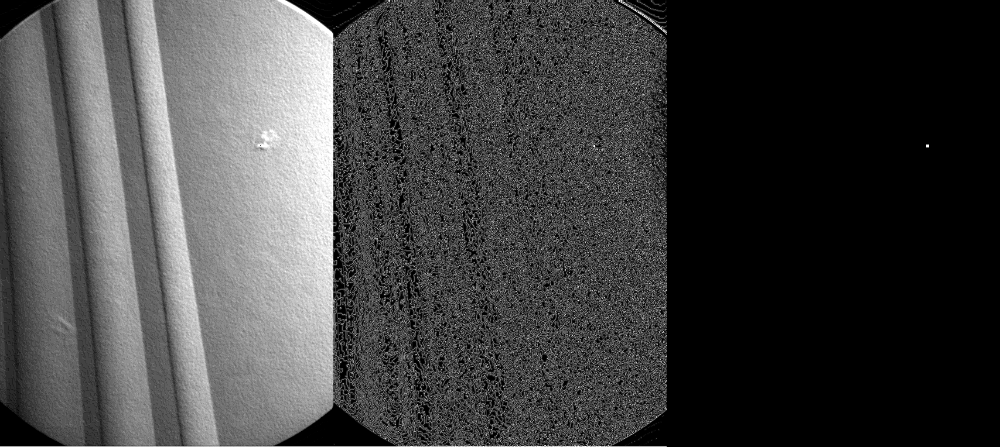

In [ ]:
def laplacian_sharpening(image,kernel):
  image_rows,image_cols = image.shape
  kernel_rows, kernel_cols = kernel.shape
  pad_rows,pad_cols = (kernel_rows - 1), (kernel_cols - 1)
  padded_image = np.pad(image,(pad_rows,pad_cols),mode = 'reflect')

  output_image = np.zeros_like(image,dtype = np.int64)
  for row in range(image_rows):
    for col in range(image_cols):
      val = np.sum(kernel * padded_image[row : row + kernel_rows, col : col + kernel_cols])
      output_image[row,col] = np.abs(val)
  return output_image

original_image = cv2.imread(path + 'Fig1004(b)(turbine_blade_black_dot).tif',cv2.IMREAD_GRAYSCALE)
lap_kernel = np.array([
    [1,1,1],
    [1,-8,1],
    [1,1,1]
    ])
lap_image = laplacian_sharpening(original_image,lap_kernel)
max_value = np.max(lap_image)
threshold = 0.9 * max_value
seg_image = np.where(lap_image > threshold, 255,0)

# Just enlarged the white point by Dilation
# se = np.ones((5,5))
# padded_seg = np.pad(seg_image,(2,2),mode = 'constant', constant_values=0)
# for i in range(seg_image.shape[0]):
#   for j in range(seg_image.shape[1]):
#     seg_image[i,j] = np.where(np.any((padded_seg[i : i + 5, j : j + 5] * se) == 255),255,0)


original_image = original_image.astype(np.int64)
cv2_imshow(cv2.hconcat([original_image,lap_image,seg_image]))

**B. LINE DETECTION**

**EXAMPLE 10.2 : Using the Laplacian for line detection**

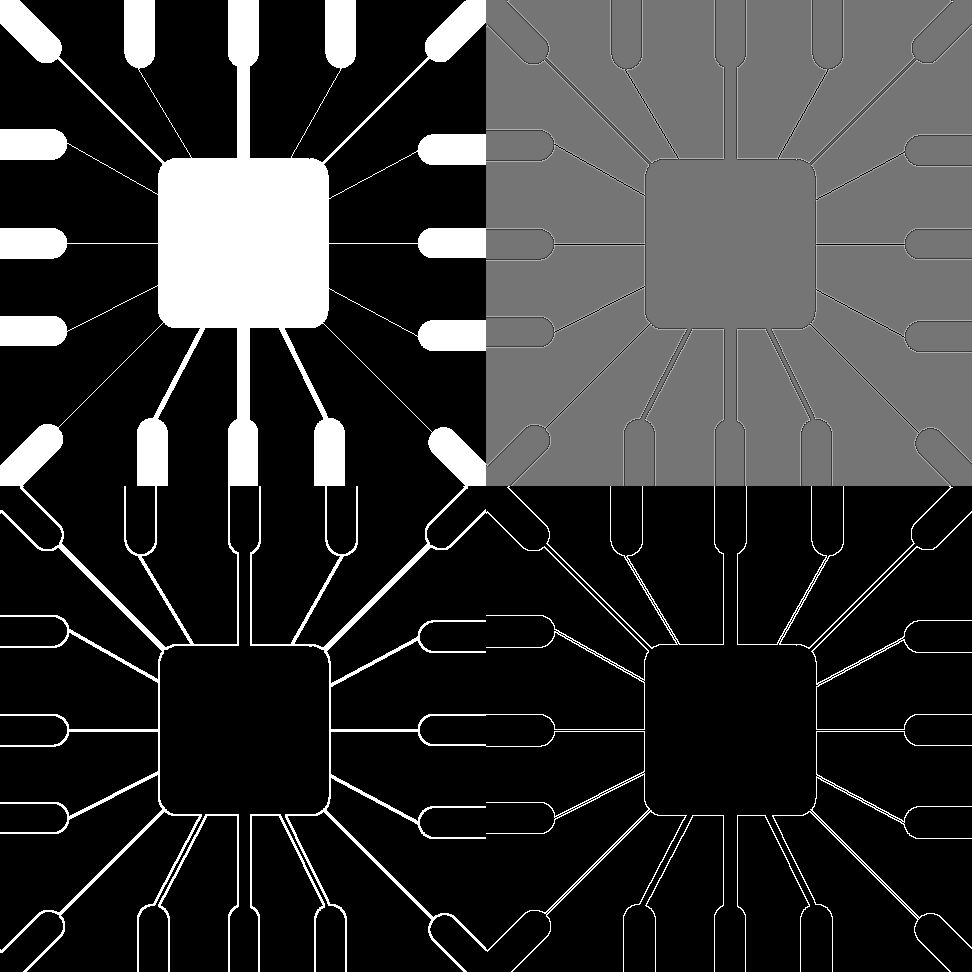

In [ ]:
def laplacian_sharpening(image,kernel):
  image_rows,image_cols = image.shape
  kernel_rows, kernel_cols = kernel.shape
  pad_rows,pad_cols = (kernel_rows - 1), (kernel_cols - 1)
  padded_image = np.pad(image,(pad_rows,pad_cols),mode = 'reflect')

  output_image = np.zeros_like(image,dtype = np.int64)
  for row in range(image_rows):
    for col in range(image_cols):
      val = np.sum(kernel * padded_image[row : row + kernel_rows, col : col + kernel_cols])
      output_image[row,col] = np.abs(val)
  return output_image

original_image = cv2.imread(path + 'Fig1005(a)(wirebond_mask).tif',cv2.IMREAD_GRAYSCALE)
lap_kernel = np.array([
    [1,1,1],
    [1,-8,1],
    [1,1,1]
    ])

# lap_image = laplacian_sharpening(original_image,lap_kernel)
# lap_img1 = lap_image - lap_image.min()
# lap_image_scaled = (lap_img1 / lap_img1.max()) * 255
# lap_image_abs = laplacian_sharpening(original_image, lap_kernel)
# original_image = original_image.astype(lap_image.dtype)
# lap_image_scaled = lap_image_scaled.astype(lap_image.dtype)
# cv2_imshow(cv2.vconcat([cv2.hconcat([original_image,lap_image_scaled]),cv2.hconcat([lap_image_abs,lap_image])]))

**EXAMPLE 10.3 : Detecting lines in specified directions**

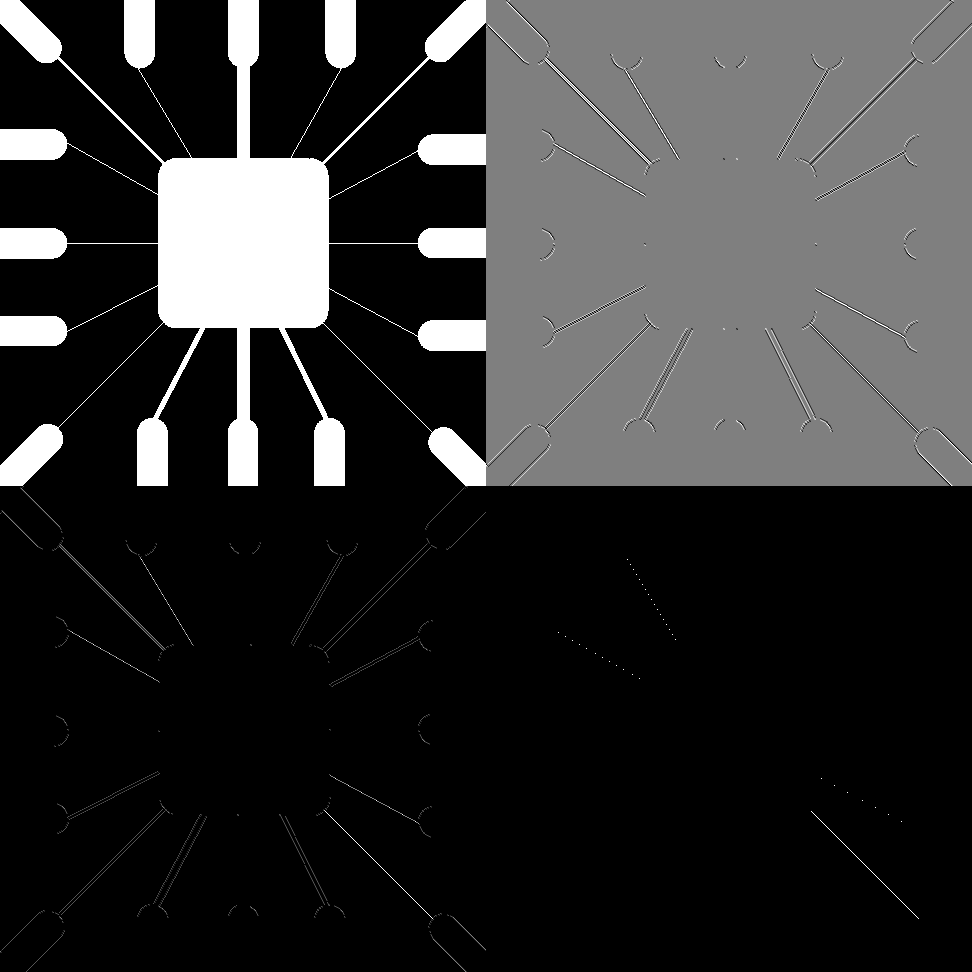

In [ ]:
def laplacian_sharpening(image,kernel):
  image_rows,image_cols = image.shape
  kernel_rows, kernel_cols = kernel.shape
  pad_rows,pad_cols = (kernel_rows - 1), (kernel_cols - 1)
  padded_image = np.pad(image,(pad_rows,pad_cols),mode = 'reflect')

  output_image = np.zeros_like(image,dtype = np.int64)
  for row in range(image_rows):
    for col in range(image_cols):
      val = np.sum(kernel * padded_image[row : row + kernel_rows, col : col + kernel_cols])
      output_image[row,col] = val
  return output_image

original_image = cv2.imread(path + 'Fig1005(a)(wirebond_mask).tif',cv2.IMREAD_GRAYSCALE)
lap_kernel = np.array([
    [2,-1,-1],
    [-1,2,-1],
    [-1,-1,2]
    ])
lap_image = laplacian_sharpening(original_image, lap_kernel)
lap_image1 = lap_image - np.min(lap_image)
lap_image_scaled = ((lap_image1 / np.max(lap_image)) * 255).astype(np.int64)
lap_positive = ((np.where(lap_image < 0, 0,lap_image) / lap_image.max()) * 255).astype(np.int64)
lap_seg = np.where(lap_positive > 254,255,0)
cv2_imshow(cv2.vconcat([cv2.hconcat([original_image.astype(np.int64), lap_image_scaled]), cv2.hconcat([lap_positive, lap_seg])]))

**C. BASIC EDGE DETECTION**

**EXAMPLE 10.6 : Illustration of the 2-D gradient magnitude and angle**

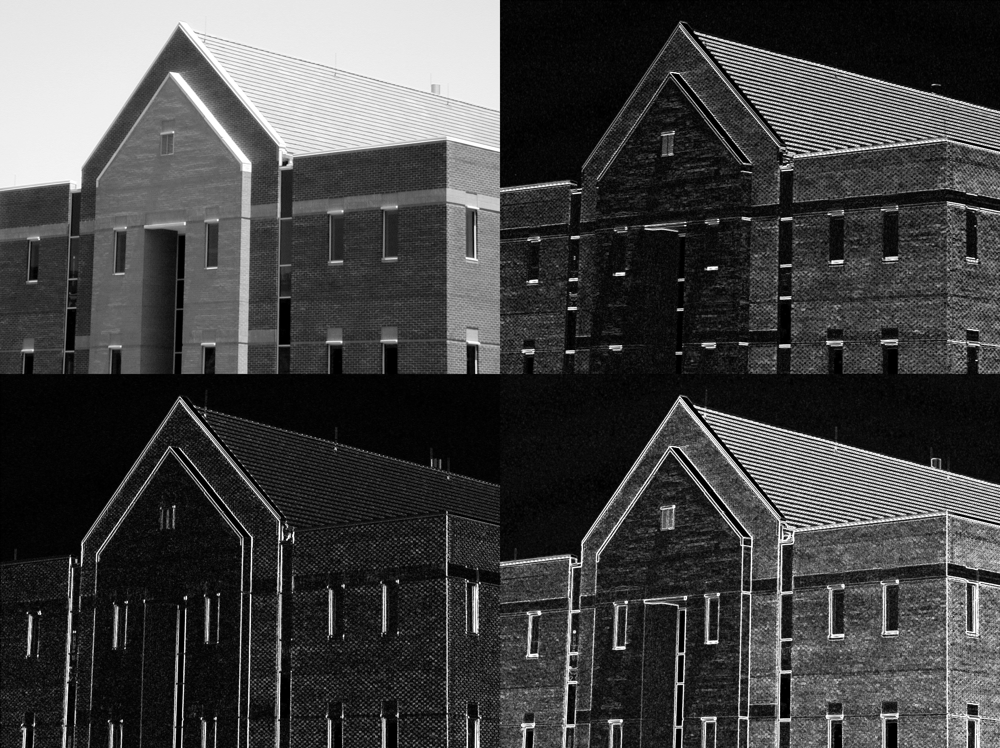

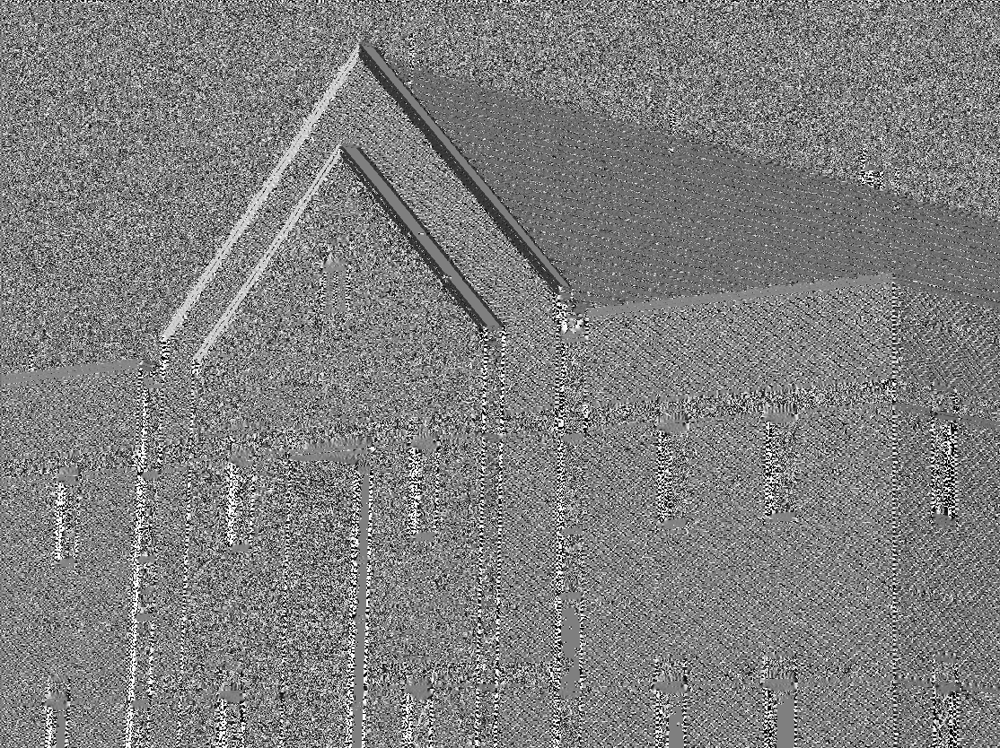

In [ ]:
def image_gradient(image, kernel):
  image_rows, image_cols = image.shape
  kernel_rows,kernel_cols = kernel.shape

  pad_rows,pad_cols = kernel_rows - 1, kernel_cols - 1
  padded_image = np.pad(image, (pad_rows,pad_cols), mode = 'reflect')

  gradient_image = np.zeros_like(image,dtype = np.int64)
  for row in range(image_rows):
    for col in range(image_cols):
      val = np.sum(kernel * padded_image[row : row + kernel_rows, col : col + kernel_cols])
      gradient_image[row,col] = val
  return gradient_image

original_image = cv2.imread(path + 'Fig1016(a)(building_original).tif',cv2.IMREAD_GRAYSCALE)
h_sobel_kernel = np.array([
    [-1,-2,-1],
    [0,0,0],
    [1,2,1]
])
v_sobel_kernel = np.array([
    [-1,0,1],
    [-2,0,2],
    [-1,0,1]
])
h_gradient_image = image_gradient(original_image,h_sobel_kernel)
v_gradient_image = image_gradient(original_image,v_sobel_kernel)
gradient_angle = np.arctan(v_gradient_image / (h_gradient_image + 1e-10))
grad_ang = gradient_angle - np.min(gradient_angle)
gradient_angle = (grad_ang / (np.max(grad_ang)) * 255).astype(np.int64)
gradient_image = np.abs(h_gradient_image) + np.abs(v_gradient_image)
original_image = original_image.astype(np.int64)
cv2_imshow(cv2.vconcat([cv2.hconcat([original_image,np.abs(h_gradient_image)]), cv2.hconcat([np.abs(v_gradient_image),gradient_image])]))
cv2_imshow(gradient_angle)

**SMOOTHING THE ABOVE IMAGE FOR BETTER RESULT ON GRADIENT**

Use a 5x5 smoothing kernel i.e averging kernel.

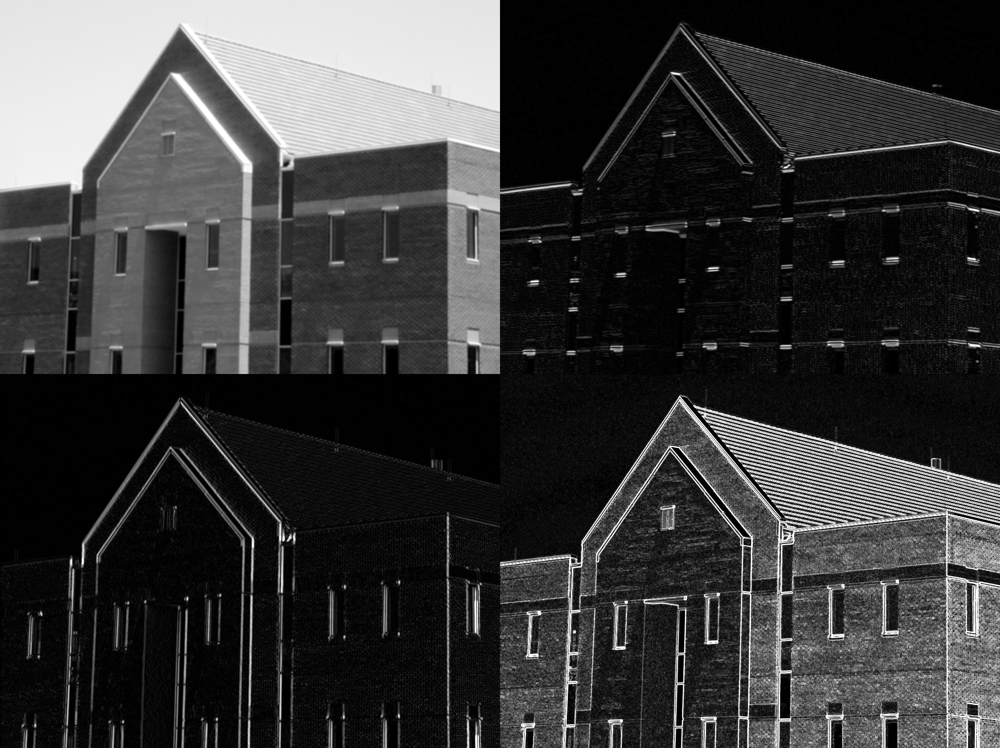

In [ ]:
def image_smoothing(image, kernel):
  image_rows, image_cols = image.shape
  kernel_rows, kernel_cols = kernel.shape

  pad_rows,pad_cols = kernel_rows - 1, kernel_cols - 1
  padded_image = np.pad(image, (pad_rows,pad_cols), mode = 'reflect')

  smoothed_image = np.zeros_like(image)
  for row in range(image_rows):
    for col in range(image_cols):
      smoothed_image[row,col] = (np.sum(kernel * padded_image[row : row + kernel_rows, col : col + kernel_cols])) / (kernel_rows * kernel_cols)
  return smoothed_image

original_image = cv2.imread(path + 'Fig1016(a)(building_original).tif',cv2.IMREAD_GRAYSCALE)

box_kernel = np.ones((5,5))
smoothed_image = image_smoothing(original_image, box_kernel).astype(np.int64)

h_sobel_kernel = np.array([
    [-1,-2,-1],
    [0,0,0],
    [1,2,1]
])
v_sobel_kernel = np.array([
    [-1,0,1],
    [-2,0,2],
    [-1,0,1]
])
h_gradient_image = np.abs(image_gradient(smoothed_image,h_sobel_kernel))
v_gradient_image = np.abs(image_gradient(smoothed_image,v_sobel_kernel))
gradient_image_smoothed = h_gradient_image + v_gradient_image
original_image = original_image.astype(np.int64)
cv2_imshow(cv2.vconcat([cv2.hconcat([smoothed_image,h_gradient_image]), cv2.hconcat([v_gradient_image,gradient_image])]))

**+-45 degree Direction Edge Detection : Kirsch Kernels**

We used here two kernels i.e 45 degree (NW) and - 45 degree (SW)

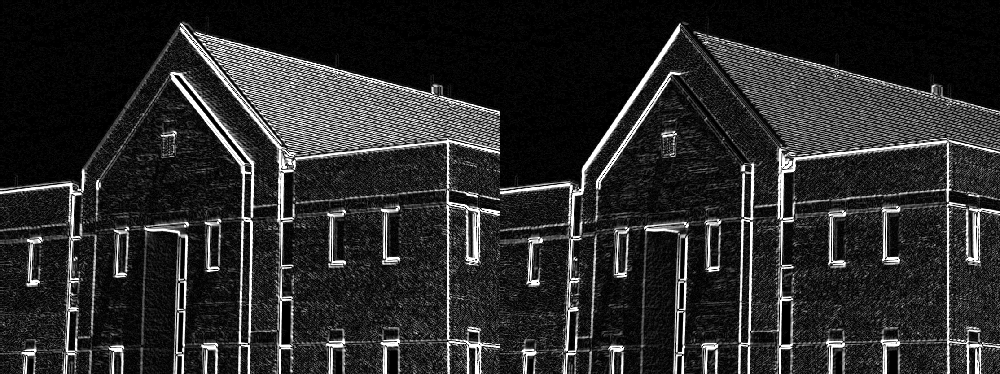

In [ ]:
nw_kirsch_kernel = np.array([
    [-3,5,5],
    [-3,0,5],
    [-3,-3,-3]
])

sw_kirsch_kernel = np.array([
    [5,5,-3],
    [5,0,-3],
    [-3,-3,-3]
])

nw_gradient_image = np.abs(image_gradient(smoothed_image,nw_kirsch_kernel))
sw_gradient_image = np.abs(image_gradient(smoothed_image,sw_kirsch_kernel))
cv2_imshow(cv2.hconcat([nw_gradient_image, sw_gradient_image]))

**Combining the Gradient with Thresholding**

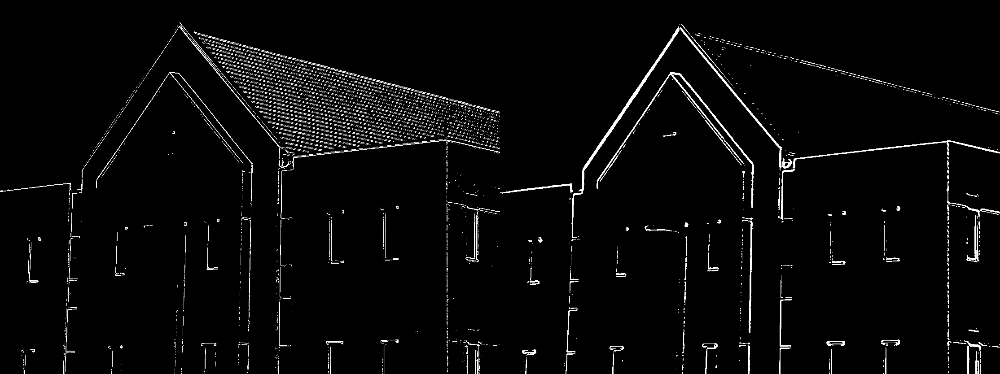

In [ ]:
threshold = 0.33 * np.max(gradient_image)
smoothed_threshold = 0.33 * np.max(gradient_image_smoothed)

seg_image = np.where(gradient_image > threshold, 255,0)
seg_image_smooth = np.where(gradient_image_smoothed > smoothed_threshold, 255, 0)
cv2_imshow(cv2.hconcat([seg_image, seg_image_smooth]))

**D. MORE ADVANCED TECHNIQUES FOR EDGE DETECTION**

**1. The Marr-Hildreth Edge Detector**

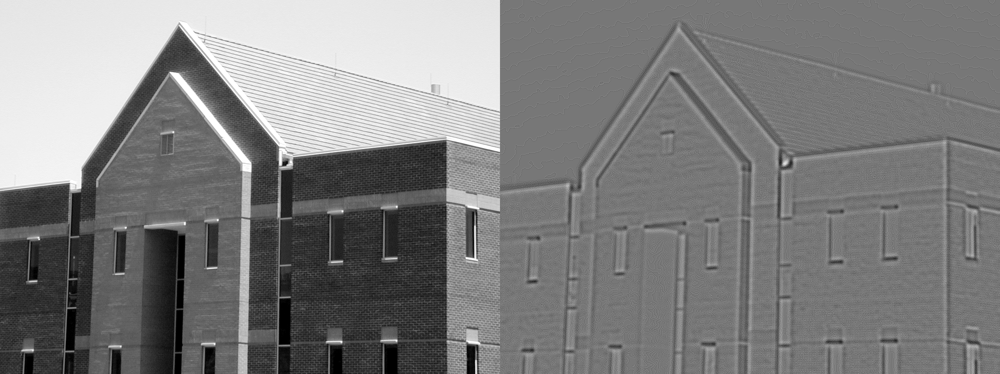

In [ ]:
import math
def laplacian_sharpening(image,kernel):
  image_rows,image_cols = image.shape
  kernel_rows, kernel_cols = kernel.shape
  pad_rows,pad_cols = (kernel_rows - 1), (kernel_cols - 1)
  padded_image = np.pad(image,(pad_rows,pad_cols),mode = 'reflect')

  output_image = np.zeros_like(image,dtype = np.int64)
  for row in range(image_rows):
    for col in range(image_cols):
      val = np.sum(kernel * padded_image[row : row + kernel_rows, col : col + kernel_cols])
      output_image[row,col] = val
  return output_image


original_image = cv2.imread(path + 'Fig1016(a)(building_original).tif',cv2.IMREAD_GRAYSCALE)
blurred_image = cv2.GaussianBlur(original_image,(25,25),4)
lap_kernel = np.array([
    [1,1,1],
    [1,-8,1],
    [1,1,1]
    ])
lap_image = cv2.Laplacian(blurred_image, cv2.CV_64F)
lap_img = lap_image - np.min(lap_image)
lap_image = lap_img / (np.max(lap_img)) * 255
cv2_imshow(cv2.hconcat([original_image.astype(lap_image.dtype), lap_image]))



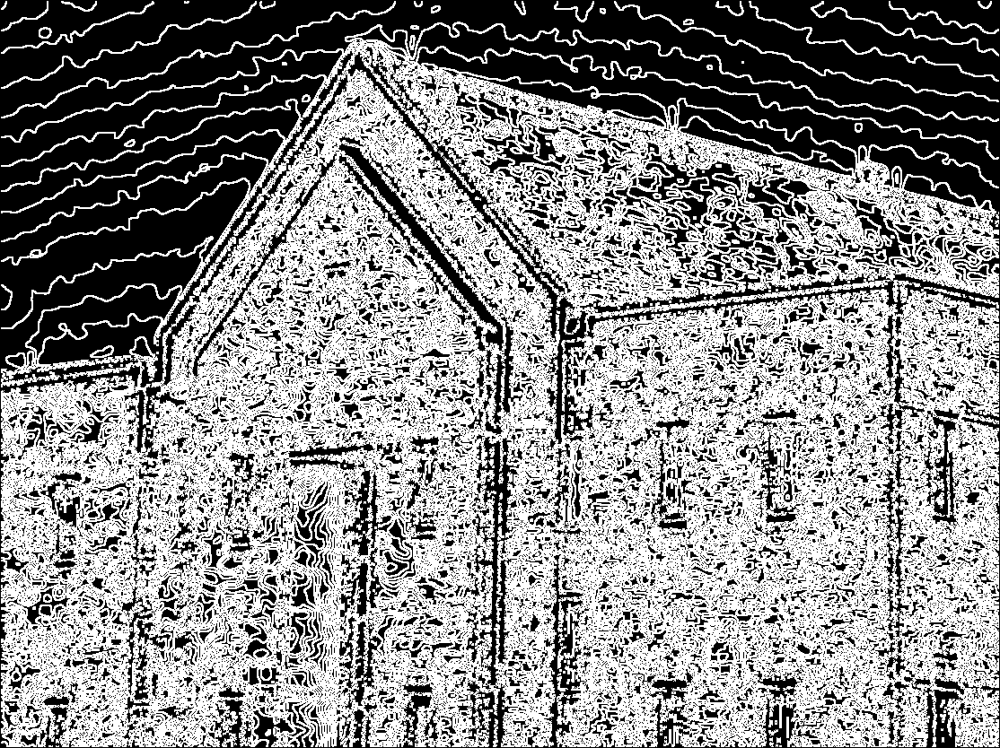

In [ ]:
def zero_crossings(image, threshold):
    rows, cols = image.shape
    zero_crossing = np.zeros_like(image, dtype=np.uint8)

    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            # Test for zero crossings in 8 directions
            if (image[i, j] * image[i, j - 1] < 0) and \
               (abs(image[i, j] - image[i, j - 1]) > threshold):
                zero_crossing[i, j] = 255
            elif (image[i, j] * image[i, j + 1] < 0) and \
                 (abs(image[i, j] - image[i, j + 1]) > threshold):
                zero_crossing[i, j] = 255
            elif (image[i, j] * image[i - 1, j] < 0) and \
                 (abs(image[i, j] - image[i - 1, j]) > threshold):
                zero_crossing[i, j] = 255
            elif (image[i, j] * image[i + 1, j] < 0) and \
                 (abs(image[i, j] - image[i + 1, j]) > threshold):
                zero_crossing[i, j] = 255
            elif (image[i, j] * image[i - 1, j - 1] < 0) and \
                 (abs(image[i, j] - image[i - 1, j - 1]) > threshold):
                zero_crossing[i, j] = 255
            elif (image[i, j] * image[i - 1, j + 1] < 0) and \
                 (abs(image[i, j] - image[i - 1, j + 1]) > threshold):
                zero_crossing[i, j] = 255
            elif (image[i, j] * image[i + 1, j - 1] < 0) and \
                 (abs(image[i, j] - image[i + 1, j - 1]) > threshold):
                zero_crossing[i, j] = 255
            elif (image[i, j] * image[i + 1, j + 1] < 0) and \
                 (abs(image[i, j] - image[i + 1, j + 1]) > threshold):
                zero_crossing[i, j] = 255

    return zero_crossing
lap_image = laplacian_sharpening(blurred_image, lap_kernel)
# lap_img = lap_image - np.min(lap_image)
# lap_image = lap_img / (np.max(lap_img)) * 255
thresh = 0.04 * np.max(lap_image)
# seg_image = detect_zero_crossings(lap_image,0)
seg_image2 = zero_crossings(lap_image,thresh)
# sg = np.where(seg_image2 > 0.04*np.max(seg_image2), 255,0)
cv2_imshow(seg_image2)


**2. The Canny Edge Detector**

**EXAMPLE 10.8 : Illustration and comparison of the Canny edge-detection method**

In [ ]:
original_image = cv2.imread(path + 'Fig1016(a)(building_original).tif',cv2.IMREAD_GRAYSCALE)
blurred_image = cv2.GaussianBlur(original_image,(25,25),4)
sobel_x = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=3)
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_direction = np.degrees(np.arctan2(sobel_y, sobel_x))


In [ ]:
def non_maximum_suppression(gradient_magnitude, gradient_direction):
    rows, cols = gradient_magnitude.shape
    suppressed_image = np.zeros_like(gradient_magnitude)

    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            direction = np.round(gradient_direction[i, j] / (np.pi/4)) % 4

            if direction == 0:  # Horizontal edge
                if (gradient_magnitude[i, j] >= gradient_magnitude[i, j - 1]) and \
                   (gradient_magnitude[i, j] >= gradient_magnitude[i, j + 1]):
                    suppressed_image[i, j] = gradient_magnitude[i, j]
            elif direction == 1:  # -45 degree edge
                if (gradient_magnitude[i, j] >= gradient_magnitude[i - 1, j - 1]) and \
                   (gradient_magnitude[i, j] >= gradient_magnitude[i + 1, j + 1]):
                    suppressed_image[i, j] = gradient_magnitude[i, j]
            elif direction == 2:  # Vertical edge
                if (gradient_magnitude[i, j] >= gradient_magnitude[i - 1, j]) and \
                   (gradient_magnitude[i, j] >= gradient_magnitude[i + 1, j]):
                    suppressed_image[i, j] = gradient_magnitude[i, j]
            elif direction == 3:  # +45 degree edge
                if (gradient_magnitude[i, j] >= gradient_magnitude[i - 1, j + 1]) and \
                   (gradient_magnitude[i, j] >= gradient_magnitude[i + 1, j - 1]):
                    suppressed_image[i, j] = gradient_magnitude[i, j]

    return suppressed_image

non_max_sup = non_maximum_suppression(gradient_magnitude,gradient_direction)

(-0.5, 1113.5, 833.5, -0.5)

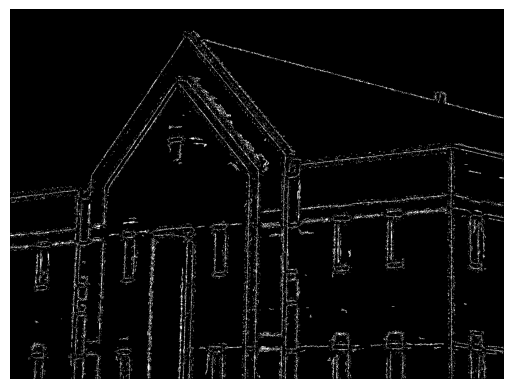

In [ ]:
def hysteresis_thresholding(image, low_threshold, high_threshold):
    rows, cols = image.shape
    strong_edges = np.zeros_like(image)
    weak_edges = np.zeros_like(image)

    strong_i, strong_j = np.where(image >= high_threshold)
    weak_i, weak_j = np.where((image >= low_threshold) & (image < high_threshold))

    strong_edges[strong_i, strong_j] = 255
    weak_edges[weak_i, weak_j] = 255

    # Edge tracing
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            if weak_edges[i, j] == 255:
                if (strong_edges[i - 1:i + 2, j - 1:j + 2] == 255).any():
                    strong_edges[i, j] = 255

    return strong_edges
T_l, T_h = 0.045 * np.max(non_max_sup), 0.1 * np.max(non_max_sup)
edge_detected = hysteresis_thresholding(non_max_sup,T_l,T_h)
plt.imshow(edge_detected,cmap = 'gray')
plt.axis('off')

**EXAMPLE 10.9 : Another illustration of the three principal edge-detection methods discussed in this section**

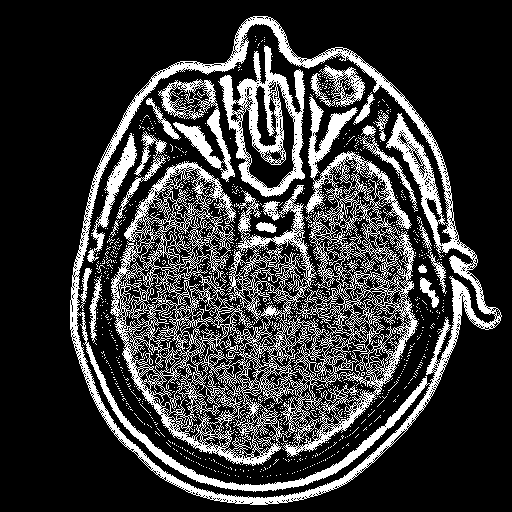

In [ ]:
original_image = cv2.imread(path + 'Fig1026(a)(headCT-Vandy).tif', cv2.IMREAD_GRAYSCALE)
# figure b
b_blurred_image = cv2.boxFilter(original_image,-1,(5,5))
sobel_x = cv2.Sobel(b_blurred_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(b_blurred_image, cv2.CV_64F, 0, 1, ksize=3)
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
thresh_gradient = np.where(gradient_magnitude > (0.15 * np.max(gradient_magnitude)),255,0)
# figure c
g_blurred_image = cv2.GaussianBlur(original_image,(19,19),3)
laplacian = cv2.Laplacian(g_blurred_image,-1,(3,3))
zero_crossings = np.zeros_like(laplacian, dtype=np.uint8)
threshold = 0.002 * np.max(laplacian)
rows, cols = laplacian.shape
for i in range(1, rows - 1):
    for j in range(1, cols - 1):
      center_value = laplacian[i,j]
      neighbors = np.array([
          laplacian[i-1,j-1],laplacian[i+1,j+1],
          laplacian[i,j-1],laplacian[i,j+1],
          laplacian[i-1,j],laplacian[i+1,j],
          laplacian[i+1,j-1], laplacian[i-1,j+1]])

      for k in range(len(neighbors)-1):
        if np.any(np.sign(neighbors) != np.sign(center_value)) and all(np.abs(neighbors - center_value) > threshold):
          zero_crossings[i,j] = 255

# figure d

G_blurred_image = cv2.GaussianBlur(original_image,(25,25),4)
sobel_x = cv2.Sobel(G_blurred_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(G_blurred_image, cv2.CV_64F, 0, 1, ksize=3)
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_direction = np.degrees(np.arctan2(sobel_y, sobel_x))
non_max_sup = non_maximum_suppression(gradient_magnitude,gradient_direction)
T_l, T_h = 0.15 * np.max(non_max_sup), 0.10 * np.max(non_max_sup)
edge_detected = hysteresis_thresholding(non_max_sup,T_l,T_h)


# Result
def show(images,titles):
  plt.figure(figsize = (10,10))
  for i in range(len(images)):
    plt.subplot(2,2,i+1)
    plt.title(titles[i])
    plt.imshow(images[i],cmap = 'gray')
    plt.axis('off')
images = [original_image,thresh_gradient,zero_crossings,edge_detected]
titles = ['Original Image','Thresh Gradient','Mar-Hildreth','Canny']
show(images,titles)

**3. LINKING EDGE POINTS**

**a. Local Processing**

**EXAMPLE 10.10 : Edge linking using local processing.**


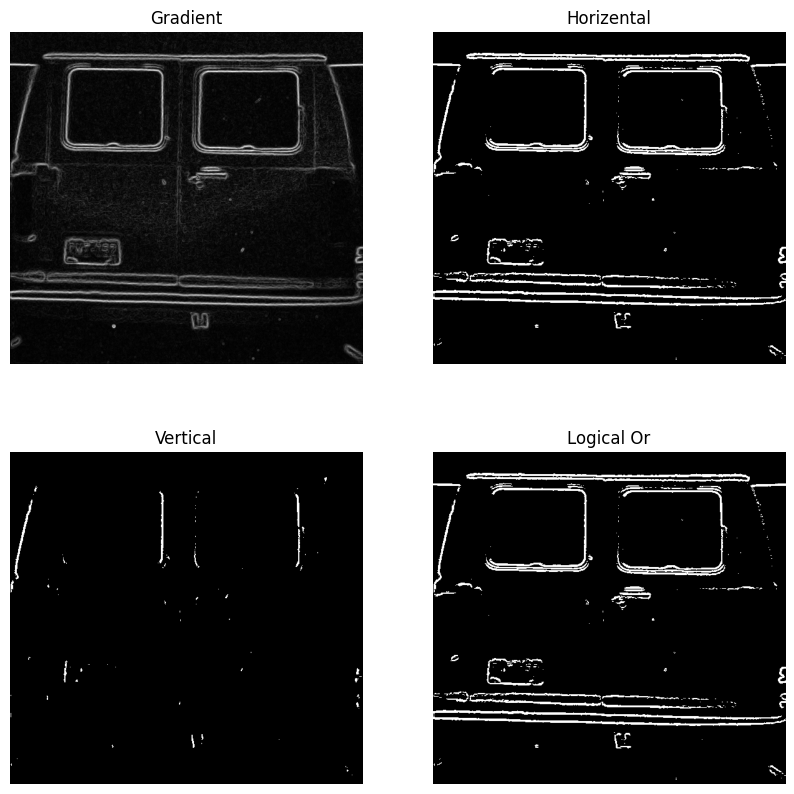

In [ ]:
original_image = cv2.imread(path + 'Fig1027(a)(van_original).tif',cv2.IMREAD_GRAYSCALE)
sobel_x = cv2.Sobel(original_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(original_image, cv2.CV_64F, 0, 1, ksize=3)
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_direction = np.degrees(np.arctan2(sobel_y, sobel_x))
T_m = 0.3 * np.max(gradient_magnitude)
A = 90
T_a = 45
grad_cond = gradient_magnitude > T_m
ang_cond_h = ((gradient_direction > -157.5) & (gradient_direction < 157.5))

ang_cond_v = (gradient_direction > -45) & (gradient_direction < 45)
hori = np.where(grad_cond & ang_cond_h,255,0)
verti = np.where(grad_cond & ang_cond_v,255,0)
logical_r = np.logical_or(hori,verti)

def show(images,titles):
  plt.figure(figsize = (10,10))
  for i in range(len(images)):
    plt.subplot(2,2,i+1)
    plt.title(titles[i])
    plt.imshow(images[i],cmap = 'gray')
    plt.axis('off')

images = [gradient_magnitude,hori,verti,logical_r]
titles = ['Gradient','Horizental','Vertical','Logical Or']
show(images,titles)

# **3.  THRESHOLDING**

**BASIC GLOBAL THRESHOLDING**

**EXAMPLE 10.13 : Global thresholding**

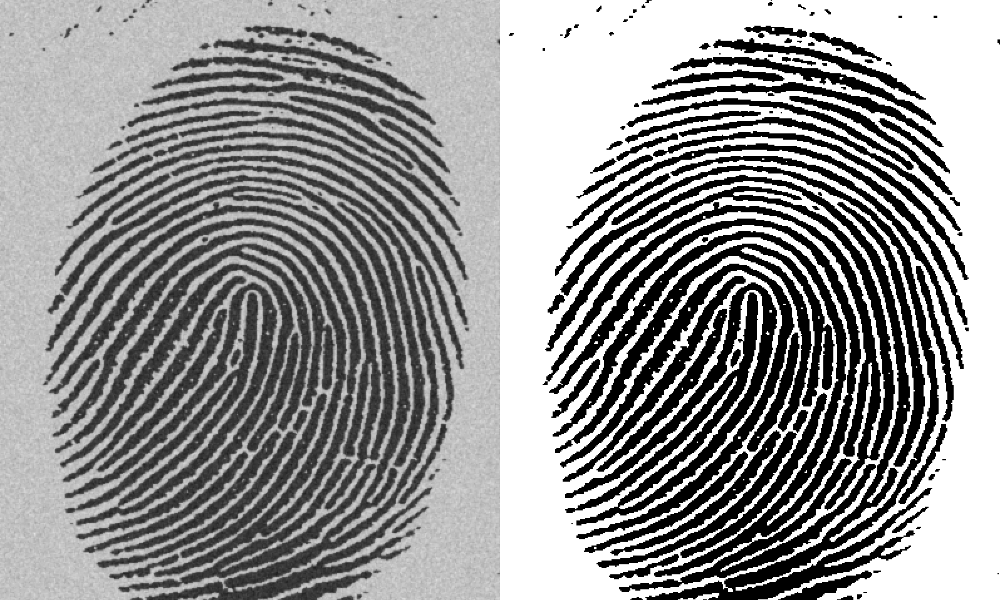

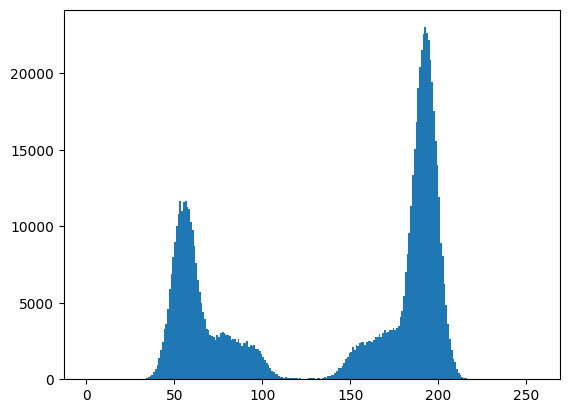

In [ ]:
def global_thresholding(image, initial_threshold, delta_threshold):
    threshold = initial_threshold
    prev_threshold = 0

    while abs(threshold - prev_threshold) > delta_threshold:
        prev_threshold = threshold
        # Segment the image
        G1 = image[image > threshold]
        G2 = image[image <= threshold]

        # Compute mean intensity values
        m1 = np.mean(G1)
        m2 = np.mean(G2)

        # Compute new threshold value
        threshold = (m1 + m2) / 2

    return threshold

original_image = cv2.imread(path + 'Fig1038(a)(noisy_fingerprint).tif',cv2.IMREAD_GRAYSCALE)

t_i = np.mean(original_image)
d_t = 0
estimated_threshold = global_thresholding(original_image, t_i, d_t)
segmented_image = np.where(original_image > estimated_threshold,255,0)
cv2_imshow(cv2.hconcat([original_image,segmented_image.astype(original_image.dtype)]))
plt.hist(original_image.ravel(), bins=256, range=[0,256])
plt.show()